In [1]:

from torchvision.ops import batched_nms
%load_ext autoreload
%autoreload 2

import sys
import os
import matplotlib.patches as patches
sys.path.append(".")

from Models.splinedist import *
import pytorch_lightning as pl
import torch
from Datasets.CISD import *
from Datasets.DSB18 import * 
from torchvision import io
import glob

In [2]:
# !pip install rasterio

In [3]:
# # pl.seed_everything(47)
# data = CISD_datamodule(path="Datasets/CISD/CISD.json", root="Datasets/CISD/center_slice", contourSize=500)
# batch_x, batch_y = next(iter(data.val_dataloader()))
# showBatch((batch_x, batch_y))
# !pip install shapely
def generateSamples(objprob, threshold=0.1, num_samples=100, height=256, width=256):
    ""
    objprob = objprob * (objprob > threshold)
    distribution = objprob / objprob.sum()

    distribution = distribution.flatten().cpu()
    cum_objprop_t = np.cumsum(distribution)

    coordinates_x = []
    coordinates_y = []
    # map uniform samples to pixels
    for i, z in enumerate(np.random.uniform(size=num_samples)):
        diff = cum_objprop_t - z

        mask = np.ma.less_equal(diff, 0)
        masked_diff = np.ma.masked_array(diff, mask)

        # position in 1D-array where x is closest but greater than array value
        min_pos = masked_diff.argmin()

        # retrieve pixel coordinates
        x = min_pos % width
        y = min_pos // height

        coordinates_x.append(x)
        coordinates_y.append(y)

    return coordinates_x, coordinates_y

# Evaluation on the Dataset

In [12]:
modelName = "Experiments/Models_final21/weights/splineDist-CISD_13-epoch=167-loss_val=5.67.ckpt"
# modelName = "Experiments/Models_final21/weights/splineDist-CISD10-epoch=231-loss_val=4.91.ckpt"
# modelName = "Experiments/Models_final2/weights/splineDist-CISD4-epoch=86-loss_val=0.08.ckpt"
model = SplineDist.load_from_checkpoint(
    checkpoint_path=modelName)
device = "cuda:4"

# Evaluation on costum images

('cuda:4',) {}
inferenceCISD/0239_AY_01073.jpg


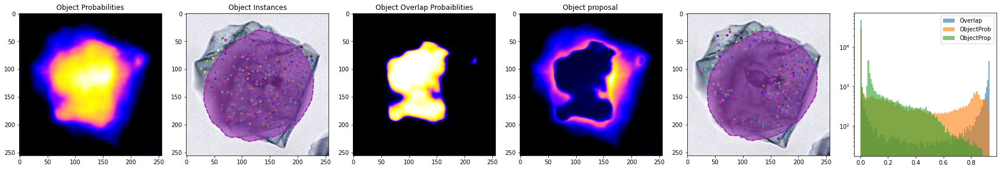

inferenceCISD/0231_K_00990.jpg


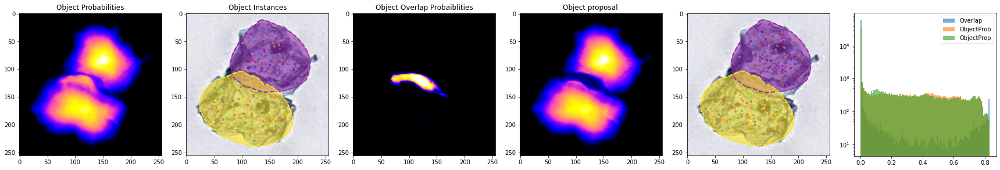

inferenceCISD/0231_K_00965.jpg


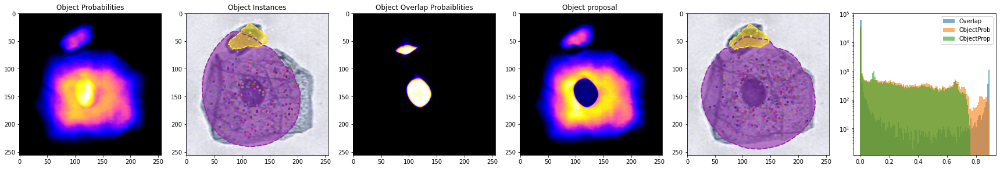

inferenceCISD/0236_BD_01639.jpg


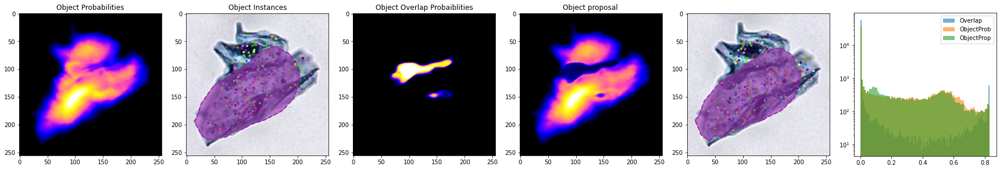

inferenceCISD/0242_BB_01116.jpg


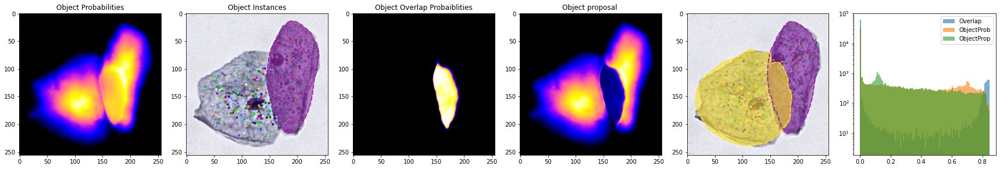

inferenceCISD/0239_AY_00996.jpg


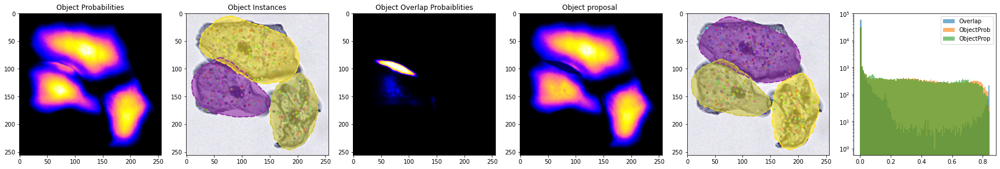

inferenceCISD/0231_K_00957.jpg


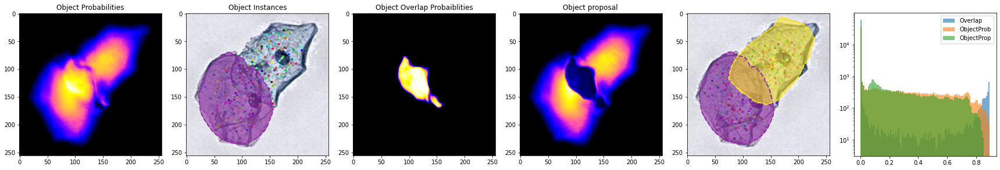

inferenceCISD/0231_K_00972.jpg


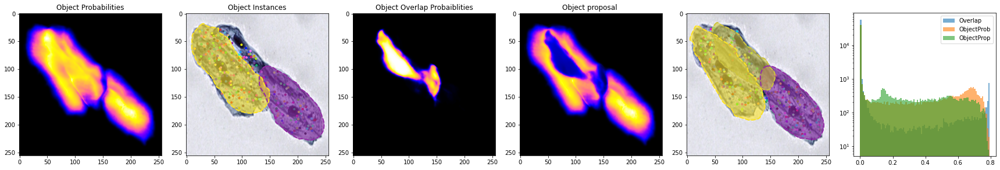

inferenceCISD/0239_AY_00962.jpg


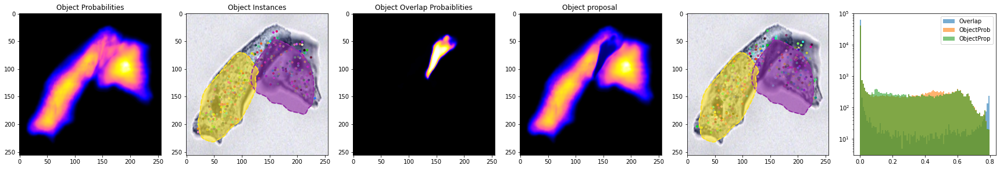

inferenceCISD/0232_BC_00962.jpg


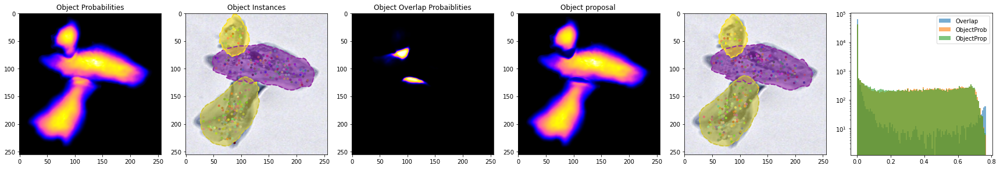

inferenceCISD/0231_K_00998.jpg


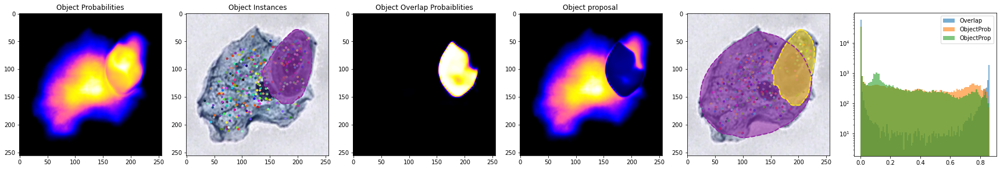

inferenceCISD/0241_BB_01529.jpg


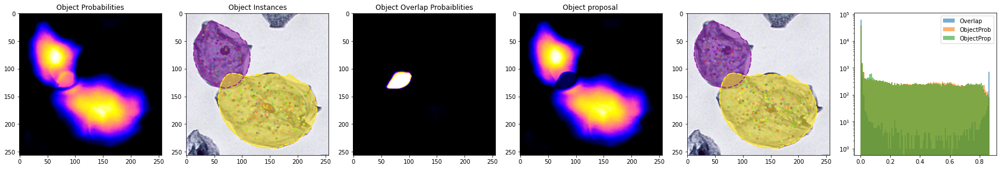

inferenceCISD/0250_AT_01856.jpg


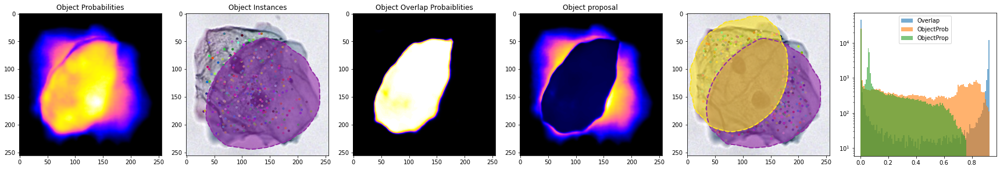

inferenceCISD/0250_AT_01665.jpg


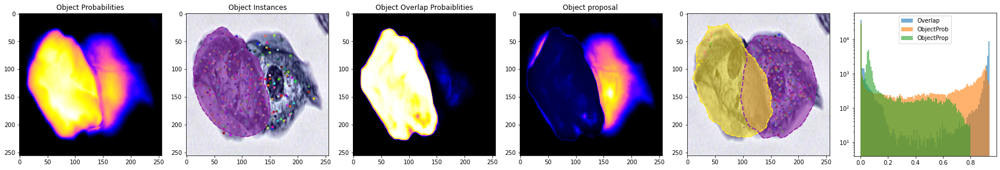

inferenceCISD/0231_K_00956.jpg


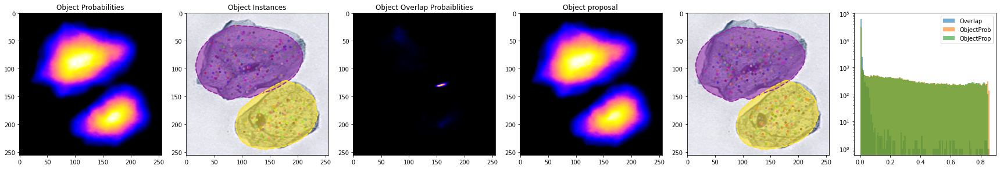

inferenceCISD/0231_K_00963.jpg


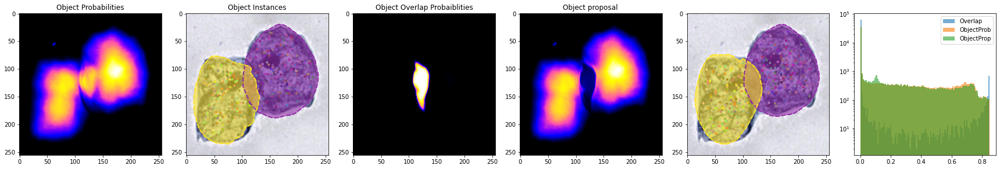

inferenceCISD/0234_BC_00712.jpg


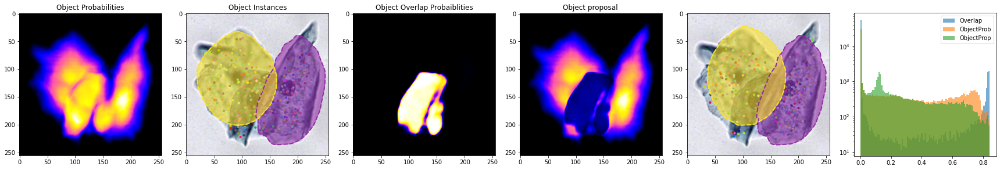

inferenceCISD/0239_AY_00545.jpg


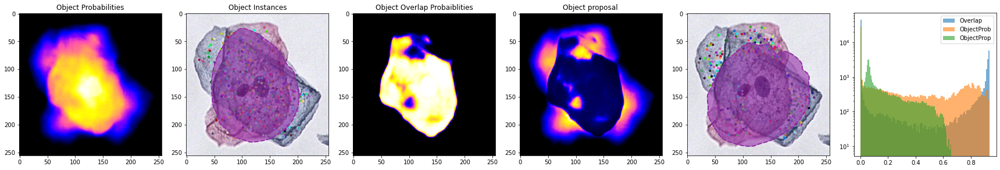

inferenceCISD/0231_K_00983.jpg


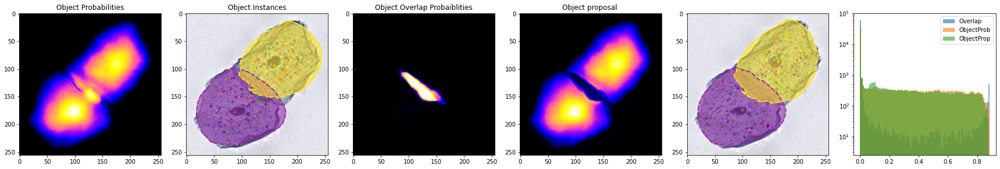

inferenceCISD/0235_BD_01202.jpg


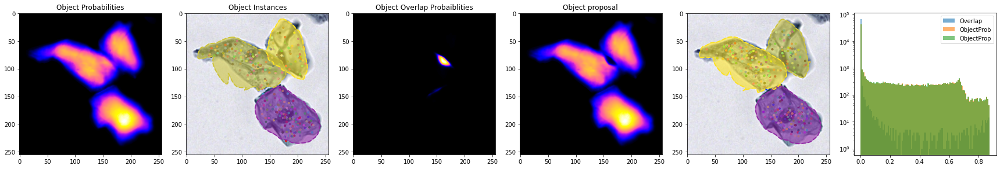

inferenceCISD/0231_K_00971.jpg


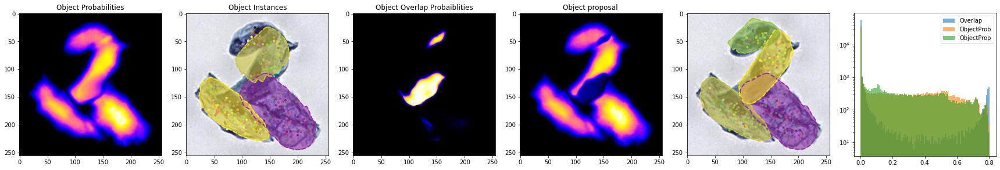

inferenceCISD/0231_K_00944.jpg


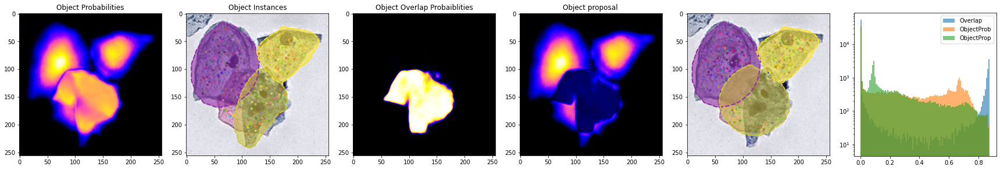

inferenceCISD/0254_AS_01684.jpg


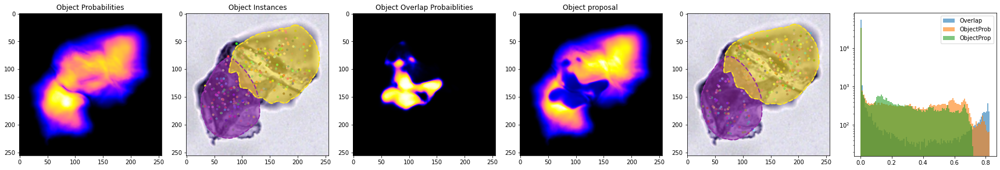

inferenceCISD/0239_AY_01215.jpg


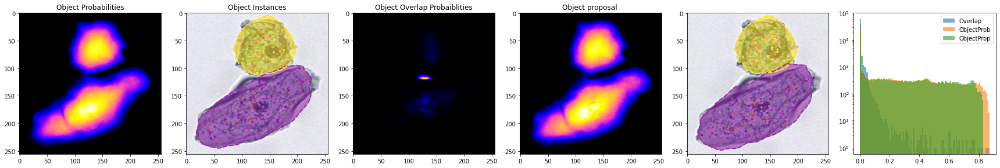

inferenceCISD/0254_AS_01362.jpg


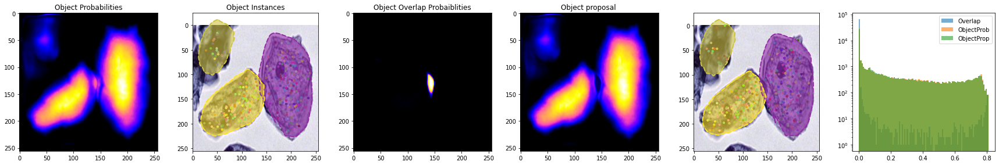

inferenceCISD/0231_K_00982.jpg


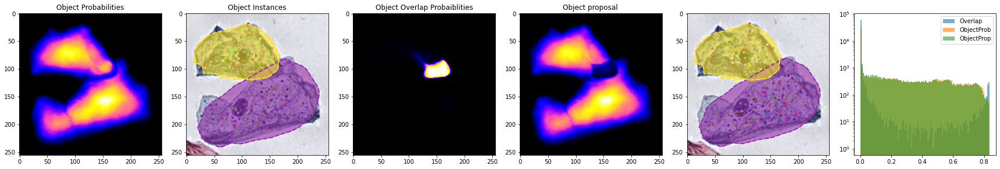

inferenceCISD/0231_K_00953.jpg


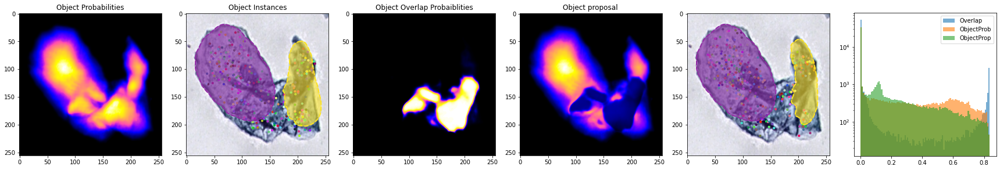

inferenceCISD/0231_K_00942.jpg


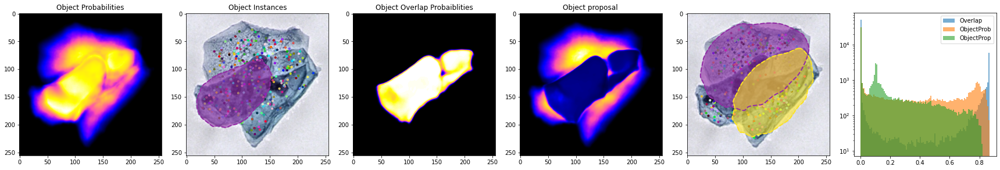

inferenceCISD/0246_BE_01052.jpg


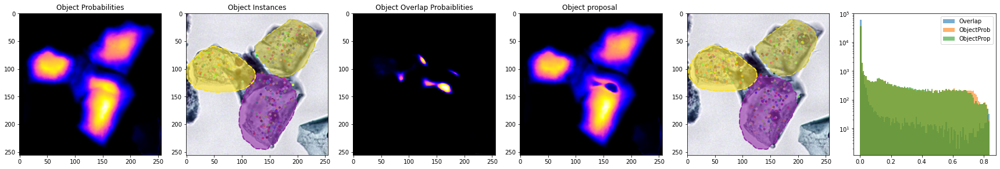

inferenceCISD/0231_K_00977.jpg


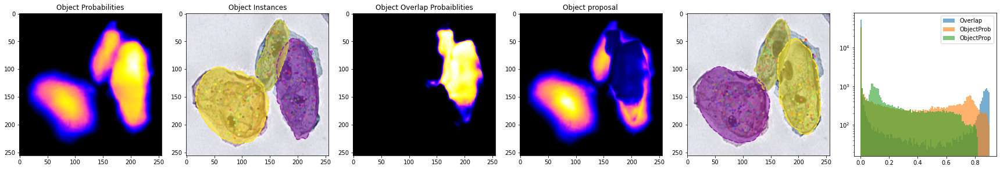

inferenceCISD/0243_BB_01138.jpg


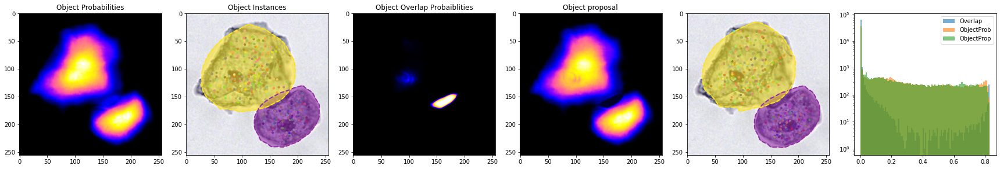

inferenceCISD/0254_AS_01149.jpg


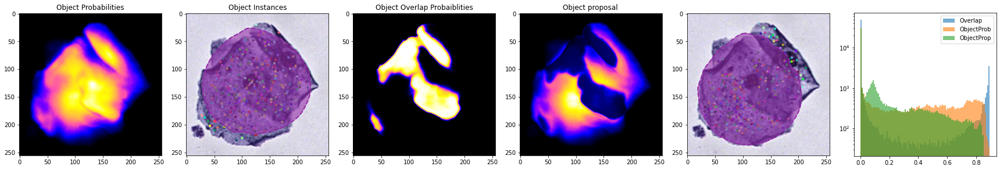

In [18]:
transforms = get_transforms(0.5, 0.5)
num_samples = 300
colors = [ list(map(lambda x: x/255, getRandomColor())) for j in range(num_samples)]
# model = model.to(device)
model = model.to(device)
MAX_CONTOUR_SIZE = model.MAX_CONTOUR_SIZE
threshold = 0.1
nms_threshold = 0.05

# MAX_CONTOUR_SIZE = 500
for image in glob.glob("inferenceCISD/*.jpg"):
    print(image)
    img = io.read_image(image, io.ImageReadMode.RGB).float()/255
    img = transforms(img).unsqueeze(0)
    img = img.to(device)
    model.eval()

    with torch.no_grad():
        (objectProbas, angles, distances, controlPoints, objectOverlap) = model(img)
        objectProbas = torch.sigmoid(objectProbas)
        objectOverlap = torch.sigmoid(objectOverlap)
        contours = getContourSamples(controlPoints, model.B3M).permute(1, 2, 3, 0, 4)
#         contours = contours.reshape(-1, MAX_CONTOUR_SIZE, 2)
        
                
        overlap = objectOverlap[0, 0].detach()
        overlap = (overlap - overlap.min())/(overlap.max() - overlap.min())#splineDist-CISD10-epoch=339-loss_val=4.45.ckpt
        objprob = objectProbas[0, 0].detach()
        overlap = objprob.max()*overlap
#         overlap = (overlap>0.05)*1.0
#         objprob = (objprob - objprob.min())/(objprob.max() - objprob.min())
        objprop = objprob * (1 - overlap)
        

        coordinates_x, coordinates_y = generateSamples(objprob, threshold, num_samples)
        coordinates_x2, coordinates_y2 = generateSamples(objprop, threshold, num_samples)
        

        xmin = torch.amin(contours[:, :, 1], dim=-1) 
        xmax = torch.amax(contours[:, :, 1], dim=-1)
        ymin = torch.amin(contours[:, :, 0], dim=-1)
        ymax = torch.amax(contours[:, :, 0], dim=-1)

#         bboxes = torch.stack([xmin, ymin, xmax, ymax], -1)
#         bboxes0 = torch.stack([xmin, ymin, xmax, ymax], -1)
        
#         scores = objprop.reshape(256*256)

#         bboxes = bboxes[scores>threshold]
#         scores2 = scores[scores>threshold]

#         selectedIds = batched_nms(bboxes, scores2, torch.ones(len(scores2)), iou_threshold=nms_threshold)

#         bboxes = bboxes.detach().cpu().numpy()
#         selectedIds = selectedIds.detach().cpu().numpy()

#         rects = bboxes[selectedIds]
        
        
#         scores3 = objprob.reshape(256*256)

#         bboxes = bboxes0[scores3>threshold]
#         scores4 = scores[scores3>threshold]

#         selectedIds2 = batched_nms(bboxes, scores4, torch.ones(len(scores4)), iou_threshold=nms_threshold)

#         bboxes = bboxes.detach().cpu().numpy()
#         selectedIds2 = selectedIds2.detach().cpu().numpy()

#         rects2 = bboxes[selectedIds2]
        
        

        # polygon IOU
        
        
        samples = tuple(zip(coordinates_y, coordinates_x))
        scores = objprob[coordinates_y, coordinates_x].cpu().detach().numpy()
        scores2 = objprop[coordinates_y2, coordinates_x2].cpu().detach().numpy()
        contours_prob = contours[0, coordinates_y, coordinates_x, :, :].cpu()
        contours_prop = contours[0, coordinates_y2, coordinates_x2, :, :].cpu()
        
#         scores = objectProbas[0].flatten(1).cpu().detach().numpy()
#         sortedInstances = np.argsort(scores).copy()

#         til = [np.searchsorted(scores[0, sortedInstances[0]], threshold)]

#         contours2 = [contours[til[0]:]]
#         print(til)
#         print(len(contours2[0]))
#         postProcessed = nonMaximumSuppresion(scores[0, sortedInstances[0, til[0]:]],
#                                             contours2[0],
#                                             threshold,
#                                             nms_threshold)
        contoursSelected, selectedIds = nonMaximumSuppresion(scores,
                                             contours_prob,
                                             threshold,
                                             nms_threshold)
        selectedIds = np.array(selectedIds)
        
        
        contoursSelected, selectedIds2 = nonMaximumSuppresion(scores2,
                                             contours_prop,
                                             threshold,
                                             nms_threshold,
                                             overlap=overlap.cpu().numpy())

        selectedIds2 = np.array(selectedIds2)

        
        # end of the non maximum suppression
        
        
        
        image = np.ones((256,256,3), np.uint8)*255
        image2 = np.uint8(denormalize(img[0].detach().cpu()).numpy().transpose(1, 2, 0)*255)
        
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
   
    
    #     image2 = clahe.apply(image2)
        img_yuv = cv2.cvtColor(image2, cv2.COLOR_RGB2YUV)

        # equalize the histogram of the Y channel
        img_yuv[:,:,0] = clahe.apply(img_yuv[:,:,0])

        # convert the YUV image back to RGB format
        image2 = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
        
    #     image2 = cv2.equalizeHist(image2)
#         ctrs = contours[scores>threshold][selectedIds].detach().cpu().numpy()
#         ctrs2 = contours[scores3>threshold][selectedIds2].detach().cpu().numpy()
        ctrs = contours_prob[selectedIds].detach().cpu().numpy()
        ctrs2 = contours_prop[selectedIds2].detach().cpu().numpy()

        fig, (ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(
                    1, 6, figsize=(24, 4))
        

        ax7.hist(overlap.cpu().numpy().reshape(-1), 100, alpha=0.6, label="Overlap")
        ax7.hist(objprob.cpu().numpy().reshape(-1), 100, alpha=0.6, label="ObjectProb")
        ax7.hist(objprop.cpu().numpy().reshape(-1), 100, alpha=0.6, label="ObjectProp")
        ax7.set_yscale('log')
        ax7.legend()
        
        ax4.set_title("Object Overlap Probaiblities")
        ax4.imshow(overlap.cpu(), cmap='gnuplot2')
        
        ax5.set_title("Object proposal ")
        ax5.imshow(objprop.cpu(), cmap='gnuplot2')
        

        
        ax2.set_title("Object Probabilities")
        # print(objectProbas.min(), objectProbas.max(), objectProbas.ptp())
        ax2.imshow(objprob.cpu(), cmap='gnuplot2')
        # plt.subplot(1,4,4)
        ax3.set_title("Object Instances")
        # instances, colors = getInstancesImageFromContours(objectContours)
        #ax4.imshow(denormalize(img[0]).cpu().numpy().transpose(1, 2, 0))
        ax3.imshow(image2)
        ax3.scatter(coordinates_x, coordinates_y, c=np.random.rand(len(coordinates_x),3), s=10)
        # ax4.imshow(instances, alpha=0.3)
        

        for j, ct in enumerate(ctrs):
            ax3.fill(ctrs[j][:, 0], ctrs[j][:, 1], color=colors[j], alpha=0.6)
            ax3.plot(ctrs[j][:, 0], ctrs[j][:, 1], color=colors[j], linewidth=2, linestyle='dashed')
            
            
        ax6.imshow(image2)
        # ax4.imshow(instances, alpha=0.3)
#         colors = [ list(map(lambda x: x/255, getRandomColor())) for j in range(len(contours))]
        ax6.scatter(coordinates_x2, coordinates_y2, c=np.random.rand(len(coordinates_x),3), s=10)
        for j, ct in enumerate(ctrs2):
            ax6.fill(ctrs2[j][:, 0], ctrs2[j][:, 1], color=colors[j], alpha=0.6)
            ax6.plot(ctrs2[j][:, 0], ctrs2[j][:, 1], color=colors[j], linewidth=2, linestyle='dashed')

        fig.tight_layout()
        plt.show()
            


In [70]:

data = CISD_datamodule(path="Datasets/CISD/CISD.json", root="Datasets/CISD/center_slice", contourSize=512)
# batch_x, batch_y = next(iter(data.val_dataloader()))



In [208]:
def matchInstances(selectedContours, selectedScores, targetContours):
        """
        """
        precisions, recalls = np.zeros((10, 10)), np.zeros((10, 10))
        TPs, FNs, FPs = np.zeros((10, 10)), np.zeros((10, 10)),  np.zeros((10, 10))
        IoU_thresholds = np.linspace(0.2, 0.8, 10)
        confidence_thresholds = np.linspace(0, 1, 10)[::-1]

        # for increasing thresholds, compute the IoU pairwise between selected and target
        cost = np.zeros((selectedContours.shape[0], targetContours.shape[0]))
        for i in range(selectedContours.shape[0]):
            for j in range(targetContours.shape[0]):
                cost[i, j] = IOU2(selectedContours[i], targetContours[j])
        
        for j, confidence_threshold in enumerate(confidence_thresholds):
        

            cost_filtered = cost[selectedScores > confidence_threshold, :]

            rows, cols = linear_sum_assignment(-cost_filtered)
            values = cost_filtered[rows, cols]
    

            for i, threshold in enumerate(IoU_thresholds):
                # compute true positifs, false negatives, false negatives
                
                TP = float((values>=threshold).sum())
                FN = targetContours.shape[0] - TP #float((values == 0).sum())
                FP = float((values<threshold).sum())
                
                
                # compute precision, recall, f1
#                 if(TP == 0):
#                     precision = 0
#                     recall = 1
#                 else:
                try:
                    precision = TP/(TP+FP)
                except:
                    precision = 1
                try:
                    recall = TP/(targetContours.shape[0])
                except:
                    recall = 0
                    
#                 if(precision == 0 or recall == 0):
#                     f1 = 0
#                 else:
#                     f1 = 2*precision*recall/(precision+recall)

                # precisions.append(precision)
                # recalls.append(recall)
                precisions[i, j] = precision
                recalls[i, j] = recall
                FPs[i, j] = FP
                TPs[i, j] = TP
                FNs[i, j] = FN

        return precisions, recalls, IoU_thresholds, TPs, FPs, FNs

In [276]:
dataset = data.valDataset

modelName = "Experiments/Models_final21/weights/splineDist-CISD_13-epoch=167-loss_val=5.67.ckpt"
device = "cuda:4"
model = SplineDist.load_from_checkpoint(
    checkpoint_path=modelName).to(device).eval()
threshold = 0.1
num_samples = 300
nms_threshold = 0.2

precisions = []
recalls = []
FPs = []
TPs = []
FNs = []

precisions2 = []
recalls2 = []
FPs2 = []
TPs2 = []
FNs2 = []

for img, target in tqdm.tqdm(dataset):
    (targetObjectProbas, targetOverlapProba, targetObjectContours, _) = target.values()
    
    targetObjectContours = targetObjectContours.reshape(256*256, -1, 2)
    targetObjectContours = torch.unique(targetObjectContours, dim=0)[1:]
    
    
#     img = img
    
    with torch.no_grad():
        (objectProbas, angles, distances, controlPoints, objectOverlap) = model(img.unsqueeze(0).to(device))
        objectProbas = torch.sigmoid(objectProbas).detach()
        objectOverlap = torch.sigmoid(objectOverlap).detach()
        contours = getContourSamples(controlPoints, model.B3M).permute(1, 2, 3, 0, 4).detach().cpu()
#         contours = contours.reshape(-1, MAX_CONTOUR_SIZE, 2)
        
                
        overlap = objectOverlap[0, 0].cpu()
        overlap = (overlap - overlap.min())/(overlap.max() - overlap.min()).cpu()#splineDist-CISD10-epoch=339-loss_val=4.45.ckpt
        objprob = objectProbas[0, 0].cpu()
        overlap = objprob.max()*overlap
#         objprob = (objprob - objprob.min())/(objprob.max() - objprob.min())
        objprop = (objprob * (1 - overlap)).cpu()
        

        coordinates_x, coordinates_y = generateSamples(objprob, threshold, num_samples)
        coordinates_x2, coordinates_y2 = generateSamples(objprop, threshold, num_samples)
        
        samples = tuple(zip(coordinates_y, coordinates_x))
        scores = objprob[coordinates_y, coordinates_x].numpy()
        scores2 = objprop[coordinates_y2, coordinates_x2].numpy()
        contours_prob = contours[0, coordinates_y, coordinates_x, :, :].numpy()
        contours_prop = contours[0, coordinates_y2, coordinates_x2, :, :].numpy()
        
        ###################################################################################
        contoursSelected, selectedIds = nonMaximumSuppresion(scores,
                                             contours_prob,
                                             threshold,
                                             nms_threshold)
        selectedIds = np.array(selectedIds)
        
        
        contoursSelected, selectedIds2 = nonMaximumSuppresion(scores2,
                                             contours_prop,
                                             threshold,
                                             nms_threshold,
                                             overlap=overlap.numpy())

        selectedIds2 = np.array(selectedIds2)
        
        
        ctrs = contours_prob[selectedIds]
        ctrs2 = contours_prop[selectedIds2]
        #####################################################################################
        
        precision, recall, thresholds, TP1, FP1, FN1 = matchInstances(ctrs, scores[selectedIds], targetObjectContours)
        precision2, recall2, thresholds2, TP2, FP2, FN2  = matchInstances(ctrs2, scores2[selectedIds2], targetObjectContours)
        
        
        precisions.append(precision)
        recalls.append(recall)
        FPs.append(FP1)
        TPs.append(TP1)
        FNs.append(FN1)
        
        precisions2.append(precision2)
        recalls2.append(recall2)
        FPs2.append(FP2)
        TPs2.append(TP2)
        FNs2.append(FN2)
    
    

('cuda:4',) {}


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 489/489 [20:31<00:00,  2.52s/it]


In [277]:
targetObjectContours[0]

tensor([[136.0000,  38.0000],
        [134.8552,  39.1448],
        [133.7104,  40.0000],
        ...,
        [139.2896,  38.0000],
        [138.1448,  38.0000],
        [137.0000,  38.0000]])

In [278]:
average_precisions = np.array(precisions).mean(0)
average_recalls = np.array(recalls).mean(0)
average_TPs = np.array(TPs).sum(0)
average_FPs = np.array(FPs).sum(0)
average_FNs = np.array(FNs).sum(0)
average_precisions11 = average_TPs/(average_TPs + average_FPs)
average_precisions11 = np.nan_to_num(average_precisions11, nan=1.0)
average_recalls11 = average_TPs/(average_TPs + average_FNs)
average_recalls11 = np.nan_to_num(average_recalls11, nan=0.0)

average_precisions2 = np.array(precisions2).mean(0)
average_recalls2 = np.array(recalls2).mean(0)
average_TPs2 = np.array(TPs2).sum(0)
average_FPs2 = np.array(FPs2).sum(0)
average_FNs2 = np.array(FNs2).sum(0)
average_precisions22 = average_TPs2/(average_TPs2 + average_FPs2)
average_precisions22 = np.nan_to_num(average_precisions22, nan=1.0)
average_recalls22 = average_TPs/(average_TPs2 + average_FNs2)
average_recalls22 = np.nan_to_num(average_recalls22, nan=0.0)
# average_precisions

/tmp/ipykernel_7248/620814923.py:6: RuntimeWarning: invalid value encountered in true_divide
  average_precisions11 = average_TPs/(average_TPs + average_FPs)
/tmp/ipykernel_7248/620814923.py:16: RuntimeWarning: invalid value encountered in true_divide
  average_precisions22 = average_TPs2/(average_TPs2 + average_FPs2)


(0.0, 1.0)

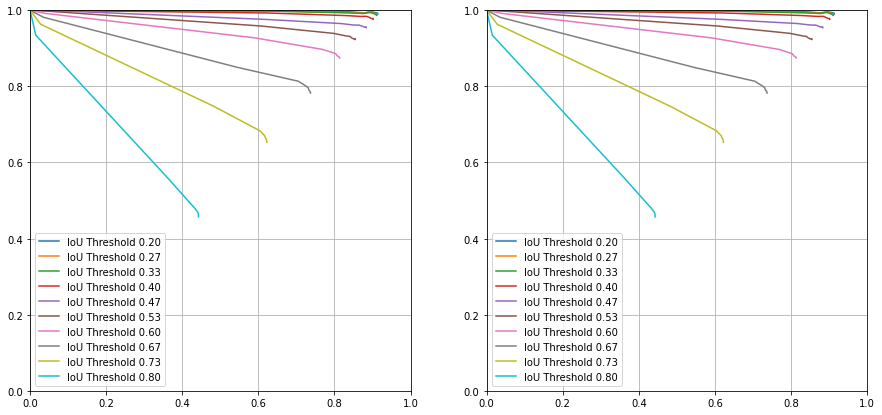

In [279]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

for i in range(10):
    ax1.plot(average_recalls[i], average_precisions[i], label=f'IoU Threshold {thresholds[i]:.2f}')
    ax2.plot(average_recalls[i], average_precisions[i], label=f'IoU Threshold {thresholds[i]:.2f}')
    
ax1.legend()
ax1.grid()
ax1.set_xlim(0, 1)
ax1.set_ylim(0, 1)

ax2.legend()
ax2.grid()
ax2.set_xlim(0, 1)
ax2.set_ylim(0, 1)

In [280]:
from sklearn.metrics import auc

In [281]:
aucs1 = []
aucs2 = []
for i in range(10):
    aucs1.append(auc(average_recalls[i], average_precisions[i]))
    aucs2.append(auc(average_recalls2[i], average_precisions2[i]))

(0.3150855169093844, 1.0)

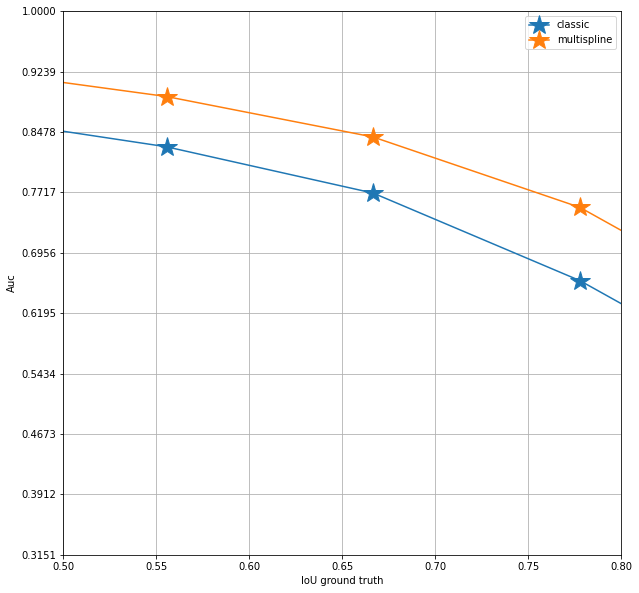

In [282]:
plt.figure(figsize=(10, 10))
plt.plot(np.linspace(0, 1, 10)[:], aucs1, label='classic', marker="*", markersize=20)
plt.plot(np.linspace(0, 1, 10)[:], aucs2, label='multispline', marker="*", markersize=20)
plt.xlabel('IoU ground truth')
plt.ylabel('Auc')
plt.yticks(np.linspace(min(min(aucs1), min(aucs2)), 1, 10))
plt.grid()
plt.legend()
plt.xlim(0.5, 0.8)
plt.ylim(min(min(aucs1), min(aucs2)), 1)

In [283]:
(np.array(aucs2) - np.array(aucs1)).mean()

0.06464399811067294

In [284]:
aucs1

[0.9128290204308469,
 0.910115714893762,
 0.9084039420535124,
 0.8964869540711378,
 0.8683888421900771,
 0.8291421585027389,
 0.7708110787936749,
 0.6605539286479325,
 0.5155790490077315,
 0.3150855169093844]

In [285]:
aucs2

[0.9652350053831418,
 0.9639463348170082,
 0.959011893792497,
 0.9466517567349682,
 0.927904333882103,
 0.8924766720846592,
 0.8414799178844375,
 0.7528325849906768,
 0.6078094295821409,
 0.3764882574558952]

(0.18828644287156604, 1.0)

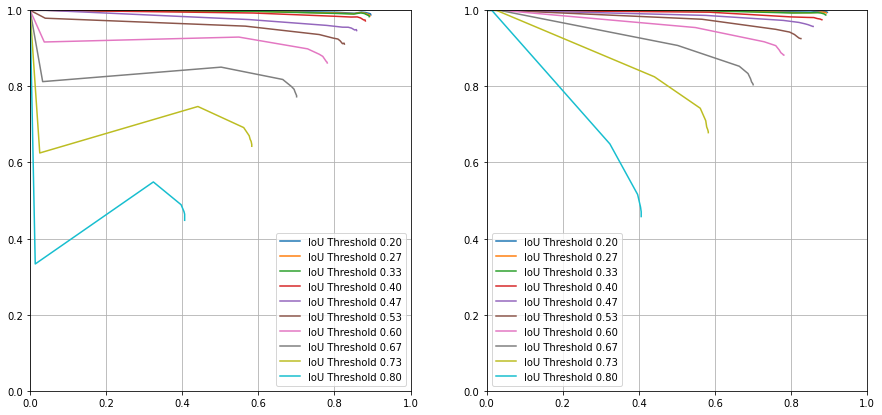

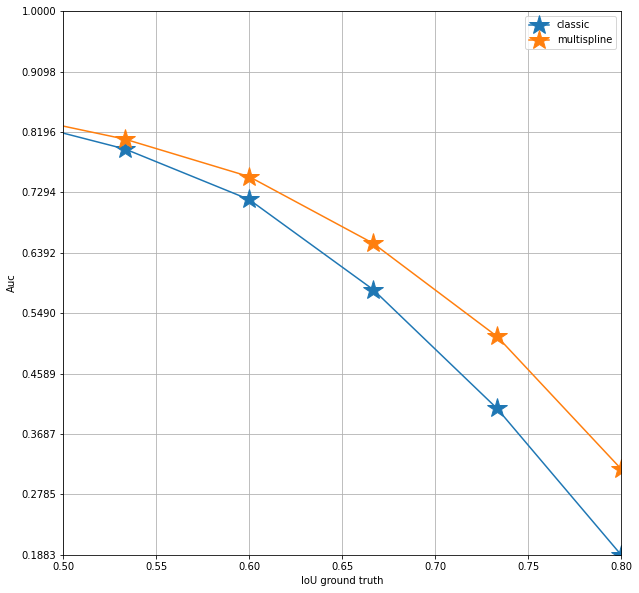

In [286]:


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

for i in range(10):
    ax1.plot(average_recalls11[i], average_precisions11[i], label=f'IoU Threshold {thresholds[i]:.2f}')
    ax2.plot(average_recalls22[i], average_precisions22[i], label=f'IoU Threshold {thresholds[i]:.2f}')
    
ax1.legend()
ax1.grid()
ax1.set_xlim(0, 1)
ax1.set_ylim(0, 1)

ax2.legend()
ax2.grid()
ax2.set_xlim(0, 1)
ax2.set_ylim(0, 1)

aucs1 = []
aucs2 = []
    
plt.figure(figsize=(10, 10))
for i in range(10):
    aucs1.append(auc(average_recalls11[i], average_precisions11[i]))
    aucs2.append(auc(average_recalls22[i], average_precisions22[i]))

plt.plot(np.linspace(0.2, 0.8, 10)[:], aucs1, label='classic', marker="*", markersize=20)
plt.plot(np.linspace(0.2, 0.8, 10)[:], aucs2, label='multispline', marker="*", markersize=20)
plt.xlabel('IoU ground truth')
plt.ylabel('Auc')
plt.yticks(np.linspace(min(min(aucs1), min(aucs2)), 1, 10))
plt.grid()
plt.legend()
plt.xlim(0.5, 0.8)
plt.ylim(min(min(aucs1), min(aucs2)), 1)

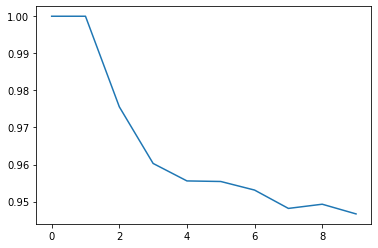

In [287]:
plt.plot(average_precisions11[4])

In [288]:
np.array(TPs2).sum(0)/(np.array(TPs2).sum(0) +  np.array(FPs2).sum(0))

/tmp/ipykernel_7248/2692933904.py:1: RuntimeWarning: invalid value encountered in true_divide
  np.array(TPs2).sum(0)/(np.array(TPs2).sum(0) +  np.array(FPs2).sum(0))


array([[       nan, 1.        , 1.        , 0.9959142 , 0.99530516,
        0.99727025, 0.99819982, 0.99644128, 0.99468556, 0.99468556],
       [       nan, 1.        , 1.        , 0.9938713 , 0.99342723,
        0.99454049, 0.99549955, 0.99466192, 0.99291408, 0.99291408],
       [       nan, 1.        , 0.99831933, 0.99284985, 0.99342723,
        0.99363057, 0.99279928, 0.99021352, 0.98759965, 0.98759965],
       [       nan, 1.        , 0.99495798, 0.98263534, 0.98122066,
        0.98089172, 0.97839784, 0.97686833, 0.97519929, 0.97519929],
       [       nan, 1.        , 0.98655462, 0.97344229, 0.96807512,
        0.96451319, 0.96219622, 0.95907473, 0.9574845 , 0.9574845 ],
       [       nan, 1.        , 0.97647059, 0.94994893, 0.942723  ,
        0.93630573, 0.93159316, 0.92704626, 0.92559787, 0.92559787],
       [       nan, 1.        , 0.95462185, 0.91726251, 0.90704225,
        0.89535942, 0.88838884, 0.88434164, 0.88219663, 0.88219663],
       [       nan, 1.        , 0.9075630

In [289]:
average_precisions2, average_precisions22

(array([[1.        , 1.        , 1.        , 0.99659168, 0.99556919,
         0.99761418, 0.99829584, 0.99710293, 0.99591002, 0.99591002],
        [1.        , 1.        , 1.        , 0.99522836, 0.99420586,
         0.99584185, 0.99652352, 0.99618269, 0.99498978, 0.99498978],
        [1.        , 1.        , 0.99897751, 0.99420586, 0.99420586,
         0.99481936, 0.9941377 , 0.99243354, 0.99055896, 0.99055896],
        [1.        , 1.        , 0.99591002, 0.98432175, 0.98449216,
         0.9858214 , 0.98394683, 0.98275392, 0.98139059, 0.98139059],
        [1.        , 1.        , 0.98909339, 0.97614179, 0.97392638,
         0.97211997, 0.9702454 , 0.96785958, 0.96666667, 0.96666667],
        [1.        , 1.        , 0.97886844, 0.95160191, 0.94989775,
         0.94843217, 0.94417178, 0.94059305, 0.93957055, 0.93957055],
        [1.        , 1.        , 0.96182686, 0.91683708, 0.91308793,
         0.90848671, 0.9030334 , 0.8997955 , 0.89860259, 0.89860259],
        [1.        , 1.    

In [290]:
FNs

[array([[2., 2., 1., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 1., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 1., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 1., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 1., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 1., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 1., 1., 1., 1., 1., 1., 1., 1.],
        [2., 2., 1., 1., 1., 1., 1., 1., 1., 1.],
        [2., 2., 1., 1., 1., 1., 1., 1., 1., 1.],
        [2., 2., 1., 1., 1., 1., 1., 1., 1., 1.]]),
 array([[2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
        [2., 2., 1., 1., 1., 1., 1., 1., 1., 1.],
        [2., 2., 1., 1., 1., 1., 1., 1., 1., 1.]

In [291]:
dataset = data.valDataset

modelName = "Experiments/Models_final21/weights/splineDist-CISD_13-epoch=167-loss_val=5.67.ckpt"
device = "cuda:4"
model = SplineDist.load_from_checkpoint(
    checkpoint_path=modelName).to(device).eval()
threshold = 0.1
num_samples = 300
nms_threshold = 0.2

AU1 = []
AU2 = []


AU11 = []
AU22 = []

for nms_threshold in tqdm.tqdm([0.05, 0.1, 0.2, 0.5]):
    precisions = []
    recalls = []
    FPs = []
    TPs = []
    FNs = []

    precisions2 = []
    recalls2 = []
    FPs2 = []
    TPs2 = []
    FNs2 = []
    for img, target in tqdm.tqdm(dataset):
        (targetObjectProbas, targetOverlapProba, targetObjectContours, _) = target.values()

        targetObjectContours = targetObjectContours.reshape(256*256, -1, 2)
        targetObjectContours = torch.unique(targetObjectContours, dim=0)[1:]


    #     img = img

        with torch.no_grad():
            (objectProbas, angles, distances, controlPoints, objectOverlap) = model(img.unsqueeze(0).to(device))
            objectProbas = torch.sigmoid(objectProbas).detach()
            objectOverlap = torch.sigmoid(objectOverlap).detach()
            contours = getContourSamples(controlPoints, model.B3M).permute(1, 2, 3, 0, 4).detach().cpu()
    #         contours = contours.reshape(-1, MAX_CONTOUR_SIZE, 2)


            overlap = objectOverlap[0, 0].cpu()
            overlap = (overlap - overlap.min())/(overlap.max() - overlap.min()).cpu()#splineDist-CISD10-epoch=339-loss_val=4.45.ckpt
            objprob = objectProbas[0, 0].cpu()
            overlap = objprob.max()*overlap
    #         objprob = (objprob - objprob.min())/(objprob.max() - objprob.min())
            objprop = (objprob * (1 - overlap)).cpu()


            coordinates_x, coordinates_y = generateSamples(objprob, threshold, num_samples)
            coordinates_x2, coordinates_y2 = generateSamples(objprop, threshold, num_samples)

            samples = tuple(zip(coordinates_y, coordinates_x))
            scores = objprob[coordinates_y, coordinates_x].numpy()
            scores2 = objprop[coordinates_y2, coordinates_x2].numpy()
            contours_prob = contours[0, coordinates_y, coordinates_x, :, :].numpy()
            contours_prop = contours[0, coordinates_y2, coordinates_x2, :, :].numpy()

            ###################################################################################
            contoursSelected, selectedIds = nonMaximumSuppresion(scores,
                                                 contours_prob,
                                                 threshold,
                                                 nms_threshold)
            selectedIds = np.array(selectedIds)


            contoursSelected, selectedIds2 = nonMaximumSuppresion(scores2,
                                                 contours_prop,
                                                 threshold,
                                                 nms_threshold,
                                                 overlap=overlap.numpy())

            selectedIds2 = np.array(selectedIds2)


            ctrs = contours_prob[selectedIds]
            ctrs2 = contours_prop[selectedIds2]
            #####################################################################################

            precision, recall, thresholds, TP1, FP1, FN1 = matchInstances(ctrs, scores[selectedIds], targetObjectContours)
            precision2, recall2, thresholds2, TP2, FP2, FN2  = matchInstances(ctrs2, scores2[selectedIds2], targetObjectContours)


            precisions.append(precision)
            recalls.append(recall)
            FPs.append(FP1)
            TPs.append(TP1)
            FNs.append(FN1)

            precisions2.append(precision2)
            recalls2.append(recall2)
            FPs2.append(FP2)
            TPs2.append(TP2)
            FNs2.append(FN2)

    average_precisions = np.array(precisions).mean(0)
    average_recalls = np.array(recalls).mean(0)
    average_TPs = np.array(TPs).sum(0)
    average_FPs = np.array(FPs).sum(0)
    average_FNs = np.array(FNs).sum(0)
    average_precisions11 = average_TPs/(average_TPs + average_FPs)
    average_precisions11 = np.nan_to_num(average_precisions11, nan=1.0)
    average_recalls11 = average_TPs/(average_TPs + average_FNs)
    average_recalls11 = np.nan_to_num(average_recalls11, nan=0.0)

    average_precisions2 = np.array(precisions2).mean(0)
    average_recalls2 = np.array(recalls2).mean(0)
    average_TPs2 = np.array(TPs2).sum(0)
    average_FPs2 = np.array(FPs2).sum(0)
    average_FNs2 = np.array(FNs2).sum(0)
    average_precisions22 = average_TPs2/(average_TPs2 + average_FPs2)
    average_precisions22 = np.nan_to_num(average_precisions22, nan=1.0)
    average_recalls22 = average_TPs/(average_TPs2 + average_FNs2)
    average_recalls22 = np.nan_to_num(average_recalls22, nan=0.0)
    # average_precisions

#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

#     for i in range(10):
#         ax1.plot(average_recalls[i], average_precisions[i], label=f'IoU Threshold {thresholds[i]:.2f}')
#         ax2.plot(average_recalls[i], average_precisions[i], label=f'IoU Threshold {thresholds[i]:.2f}')

#     ax1.legend()
#     ax1.grid()
#     ax1.set_xlim(0, 1)
#     ax1.set_ylim(0, 1)

#     ax2.legend()
#     ax2.grid()
#     ax2.set_xlim(0, 1)
#     ax2.set_ylim(0, 1)
    aucs1 = []
    aucs2 = []
    for i in range(10):
        aucs1.append(auc(average_recalls[i], average_precisions[i]))
        aucs2.append(auc(average_recalls2[i], average_precisions2[i]))
        
    AU1.append(aucs1)
    AU2.append(aucs2)
    
    aucs1 = []
    aucs2 = []
    for i in range(10):
        aucs1.append(auc(average_recalls11[i], average_precisions11[i]))
        aucs2.append(auc(average_recalls22[i], average_precisions22[i]))
        
    AU11.append(aucs1)
    AU22.append(aucs2)

('cuda:4',) {}


 13%|██████████████████████████▌                                                                                                                                                                          | 66/489 [02:30<14:32,  2.06s/it]


 27%|█████████████████████████████████████████████████████▋                                                                                                                                              | 134/489 [05:04<12:59,  2.20s/it]


 41%|████████████████████████████████████████████████████████████████████████████████▉                                                                                                                   | 202/489 [07:35<10:24,  2.18s/it]


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                       | 270/489 [10:14<07:56,  2.18s/it]


 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 338/489 [12:39<05:04,  2.01s/it]


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 406/489 [15:03<02:51,  2.07s/it]


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 474/489 [17:33<00:37,  2.48s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 489/489 [18:09<00:00,  2.23s/it]
/tmp/ipykernel_7248/2156125276.py:106: RuntimeWarning: invalid value encountered in true_divide
  average_precisions11 = average_TPs/(average_TPs + average_FPs)
/tmp/ipykernel_7248/2156125276.py:116: RuntimeWarning: invalid value encountered in true_divide
  average_precisions22 = average_TPs2/(average_TPs2 + average_FPs2)
 10%|███████████████████▋                                                                                                                                                                                 | 49/489 [01:52<19:30,  2.66s/it]


 24%|██████████████████████████████████████████████▉                                                                                                                                                     | 117/489 [04:31<15:25,  2.49s/it]


 38%|██████████████████████████████████████████████████████████████████████████▏                                                                                                                         | 185/489 [07:17<12:05,  2.39s/it]


 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                              | 253/489 [10:16<11:45,  2.99s/it]


 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 321/489 [13:03<07:17,  2.61s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 389/489 [15:46<03:57,  2.38s/it]


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 457/489 [18:34<01:14,  2.32s/it]


  7%|█████████████▋                                                                                                                                                                                       | 34/489 [01:22<18:22,  2.42s/it]


 21%|████████████████████████████████████████▉                                                                                                                                                           | 102/489 [04:03<17:25,  2.70s/it]


 35%|████████████████████████████████████████████████████████████████████▏                                                                                                                               | 170/489 [07:02<12:09,  2.29s/it]


 49%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                    | 238/489 [09:49<11:01,  2.63s/it]


 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 306/489 [12:27<06:54,  2.26s/it]


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 374/489 [15:02<04:40,  2.44s/it]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 442/489 [17:40<02:03,  2.63s/it]


  4%|███████▋                                                                                                                                                                                             | 19/489 [03:05<49:38,  6.34s/it]


 18%|███████████████████████████████████                                                                                                                                                                  | 87/489 [11:47<17:13,  2.57s/it]


 32%|██████████████████████████████████████████████████████████████▏                                                                                                                                     | 155/489 [18:33<19:58,  3.59s/it]


 46%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                          | 223/489 [28:26<33:04,  7.46s/it]


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 291/489 [35:52<11:06,  3.37s/it]


 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 359/489 [40:31<05:58,  2.76s/it]


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 427/489 [49:23<03:03,  2.96s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [1:53:48<00:00, 1707.08s/it]


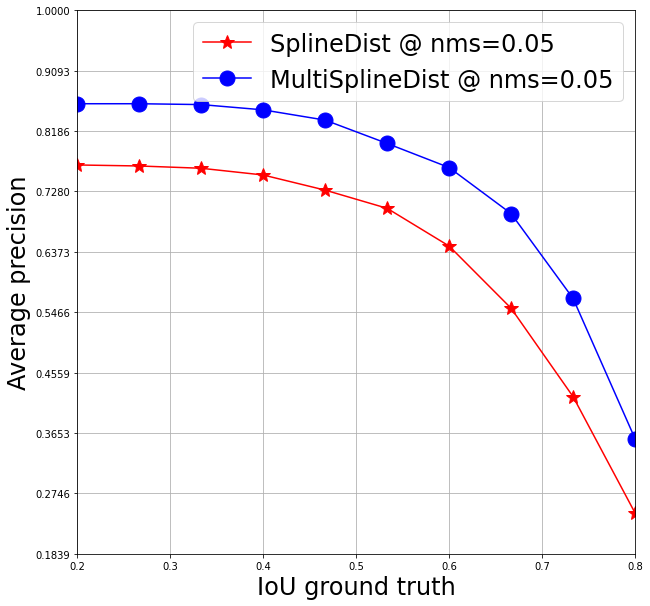

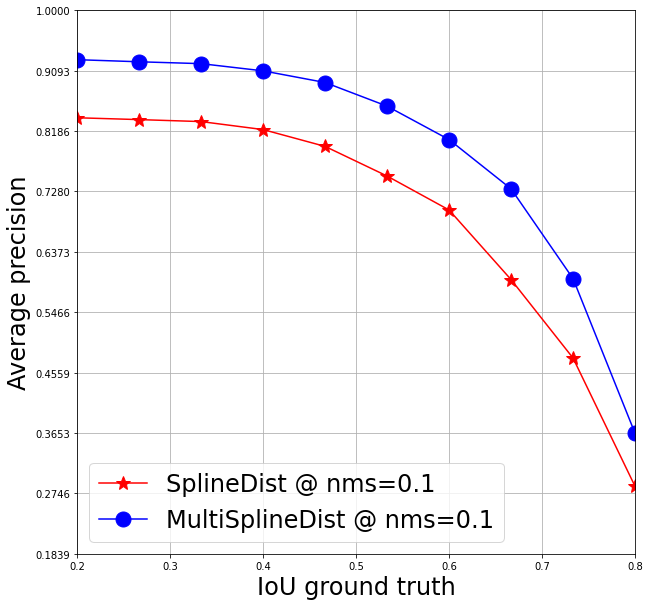

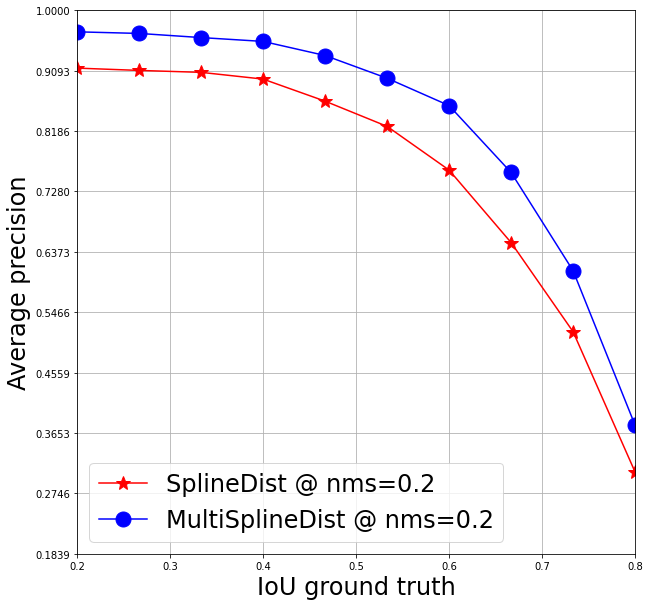

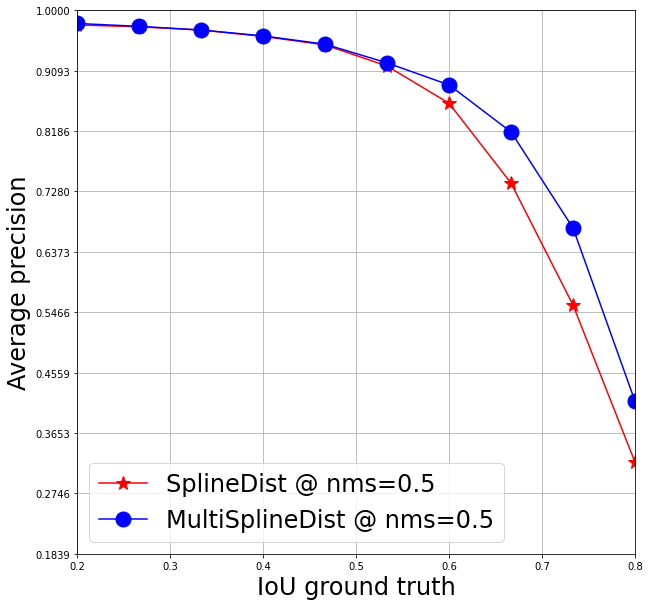

In [309]:
nms_thresholds = [0.05, 0.1, 0.2, 0.5]
    

for i in range(len(AU1)):
    plt.figure(figsize=(10, 10))
    plt.plot(np.linspace(0.2, 0.8, 10)[:], AU1[i], "r-*", label= f'SplineDist @ nms={nms_thresholds[i]}', markersize=15)
    plt.plot(np.linspace(0.2, 0.8, 10)[:], AU2[i], "b-o", label= f'MultiSplineDist @ nms={nms_thresholds[i]}', markersize=15)

    plt.xlabel('IoU ground truth', fontsize=24)
    plt.ylabel('Average precision', fontsize=24)
    plt.yticks(np.linspace(min(min(aucs1), min(aucs2)), 1, 10))
    plt.grid()
    plt.legend(prop={'size': 24})
    plt.xlim(0.2, 0.8)
    plt.ylim(min(min(aucs1), min(aucs2)), 1)
    plt.show()

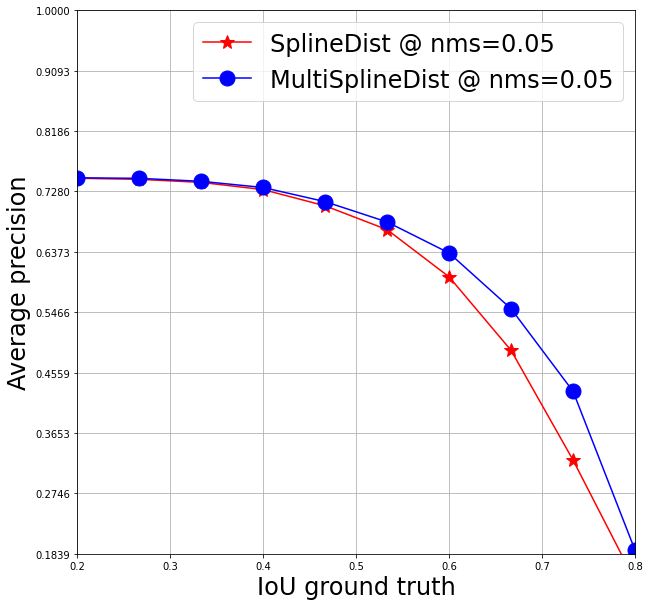

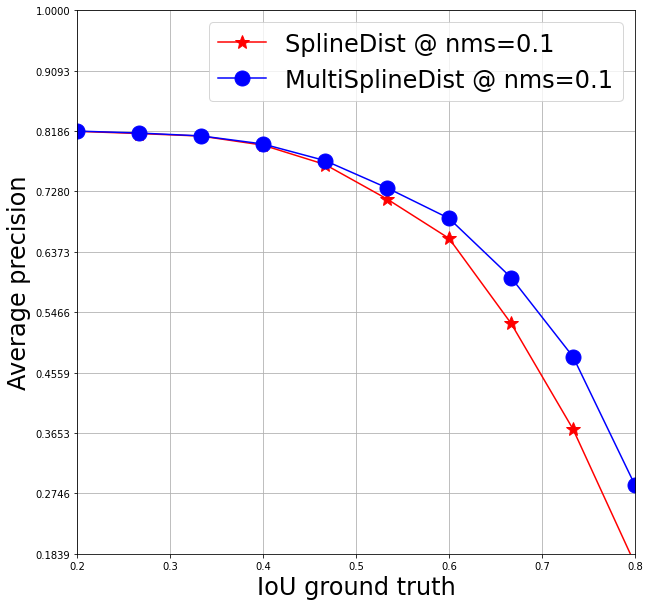

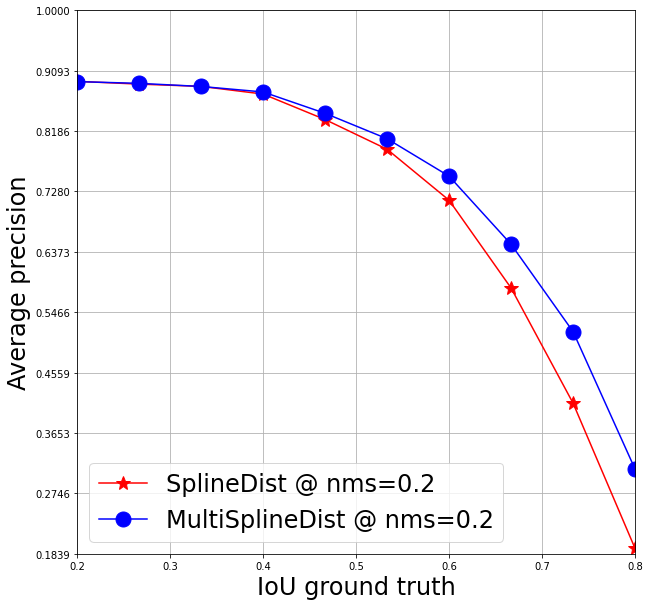

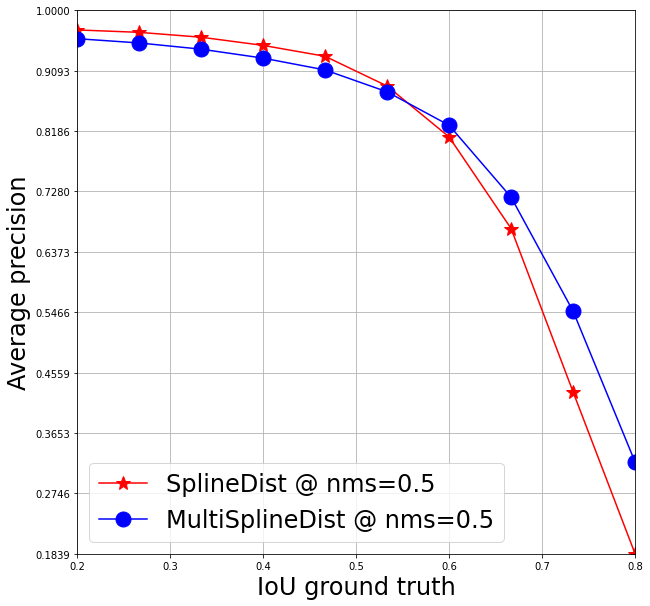

In [310]:
nms_thresholds = [0.05, 0.1, 0.2, 0.5]
    

for i in range(len(AU1)):
    plt.figure(figsize=(10, 10))
    plt.plot(np.linspace(0.2, 0.8, 10)[:], AU11[i], "r-*", label= f'SplineDist @ nms={nms_thresholds[i]}', markersize=15)
    plt.plot(np.linspace(0.2, 0.8, 10)[:], AU22[i], "b-o", label= f'MultiSplineDist @ nms={nms_thresholds[i]}', markersize=15)


    plt.xlabel('IoU ground truth', fontsize=24)
    plt.ylabel('Average precision', fontsize=24)
    plt.yticks(np.linspace(min(min(aucs1), min(aucs2)), 1, 10))
    plt.grid()
    plt.legend(prop={'size': 24})
    plt.xlim(0.2, 0.8)
    plt.ylim(min(min(aucs1), min(aucs2)), 1)
    plt.show()

In [ ]:
AUC1
